# PADIM

In [136]:
import matplotlib.pyplot
import numpy
import os
import PIL
import random
import scipy
from sklearn.metrics import roc_curve, roc_auc_score
import torch
import torchvision
import tqdm

## Downloading and visualizing the dataset


In [2]:
!wget https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420938113-1629952094/mvtec_anomaly_detection.tar.xz

--2024-02-26 16:17:56--  https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420938113-1629952094/mvtec_anomaly_detection.tar.xz
Resolving www.mydrive.ch (www.mydrive.ch)... 91.214.169.64
Connecting to www.mydrive.ch (www.mydrive.ch)|91.214.169.64|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5264982680 (4.9G) [application/x-xz]
Saving to: ‘mvtec_anomaly_detection.tar.xz’

mvtec_anomaly_detec 100%[===================>]   4.90G  19.0MB/s    in 4m 29s  

2024-02-26 16:22:27 (18.7 MB/s) - ‘mvtec_anomaly_detection.tar.xz’ saved [5264982680/5264982680]



In [3]:
!mkdir data
!tar -xf mvtec_anomaly_detection.tar.xz -C ./data

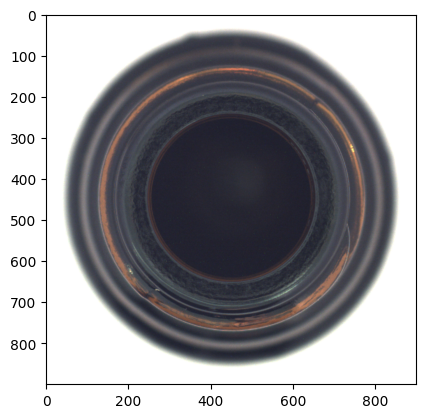

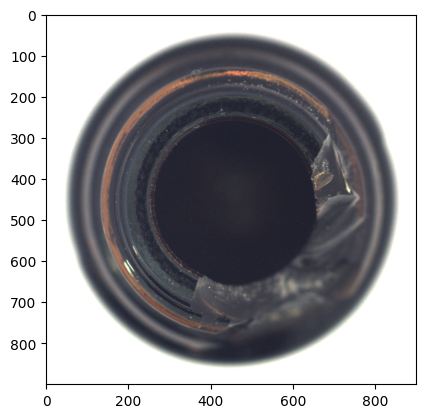

In [4]:
with PIL.Image.open("./data/bottle/train/good/000.png") as _im:
  matplotlib.pyplot.imshow(_im)
  matplotlib.pyplot.show()
with PIL.Image.open("./data/bottle/test/broken_large/000.png") as _im:
  matplotlib.pyplot.imshow(_im)
  matplotlib.pyplot.show()

## Setting up for data loading

In [5]:
class MVTecDataset(torch.utils.data.Dataset):
  def __init__(self, dataset_path, is_train, resize = 256):
    self.dataset_path = dataset_path
    self.resize = resize
    self.is_train = is_train
    self.test_folders = None

    self.transform_im = torchvision.transforms.Compose([
        torchvision.transforms.Resize(self.resize),
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Normalize(mean = [0.5, 0.5, 0.5],
                                         std = [0.1, 0.1, 0.1])
    ])

    self.transform_mask = torchvision.transforms.Compose([
        torchvision.transforms.Resize(self.resize),
        torchvision.transforms.ToTensor()
    ])

    self._x, self._y, self._mask = self.initialize_data()
    self.len = len(self._x)

  def initialize_data(self):
    x = []
    y = []
    mask = []

    if not self.is_train:
      _ground_truth_dir = self.dataset_path.replace("test", "ground_truth")
      dirs = os.listdir(self.dataset_path)
      dirs.remove("good")
      for dir in dirs:
        for img, _mask in zip(sorted(os.listdir(f"{self.dataset_path}/{dir}")),
                             os.listdir(f"{_ground_truth_dir}/{dir}")):
          x.append(f"{self.dataset_path}/{dir}/{img}")
          y.append(1)
          mask.append(f"{_ground_truth_dir}/{dir}/{_mask}")

    for img in sorted(os.listdir(f"{self.dataset_path}/good")):
      x.append(f"{self.dataset_path}/good/{img}")
      y.append(0)
      mask.append(None)

    assert len(x) == len(y)
    return x, y, mask

  def __getitem__(self, idx):
    x = self._x[idx]
    y = self._y[idx]
    mask = self._mask[idx]

    x = PIL.Image.open(x).convert('RGB')
    x = self.transform_im(x)

    if y == 0:
      mask = torch.zeros([1, self.resize, self.resize])
    else:
      mask = PIL.Image.open(mask)
      mask = self.transform_mask(mask)

    return x, y, mask

  def __len__(self):
    return self.len

## It's PADIM Time

In [119]:
class PADIM(torch.nn.Module):
  # Public
  def __init__(self, device, path = None, is_training = False, embedding_index = None):
    super().__init__()
    # Settings
    self.device = device
    self.path = path
    self.is_training = is_training
    self.embedding_index = embedding_index

    # Private
    self.__model = torchvision.models.resnet18(pretrained = True, progress = True)
    self.__model.to(device)
    self.__model.eval()
    self.__model.layer1[-1].register_forward_hook(self.__forward_hook)
    self.__model.layer2[-1].register_forward_hook(self.__forward_hook)
    self.__model.layer3[-1].register_forward_hook(self.__forward_hook)

    self.__hidden_vector = None
    self.__mean = None
    self.__covariance = None
    self.__embedding_vector = None

    self.__embedding_vector_test = None


  def forward(self, x):
    with torch.no_grad():
      self.__hidden_vector = []
      _ = self.__model(x.to(self.device))
      _ = torch.cat((self.__hidden_vector[0],
                     self.__hidden_vector[1],
                     self.__hidden_vector[2]), 1)

      _ = torch.index_select(_, 1, self.embedding_index)

      if self.__embedding_vector == None:
        self.__embedding_vector = _
      else:
        self.__embedding_vector = torch.cat((self.__embedding_vector, _), 0)

      return self.__hidden_vector

  def reset_memory(self):
    self.__hidden_vector = None
    self.__embedding_vector = None

  def get_embedding_vector(self):
    return self.__embedding_vector

  def set_embedding_index(self, idx):
    self.embedding_index = idx

  def get_embedding_index(self, idx):
    return self.embedding_index

  def set_training(self, is_training):
    self.is_training = is_training

  def save(self):
    if not os.path.isdir(self.path):
      os.makedirs(self.path)
    torch.save(self.embedding_index, self.path + "/embeddingidx.pt")
    torch.save(self.__mean, self.path + "/mean.pt")
    torch.save(self.__covariance, self.path + "/covariance.pt")

  def save_embedding(self):
    if not os.path.isdir(self.path):
      os.makedirs(self.path)
    torch.save(self.__embedding_vector, self.path + "/embedding.pt")
    torch.save(self.embedding_index, self.path + "/embeddingidx.pt")

  def load_embedding(self):
    self.__embedding_vector = torch.load(self.path + "/embedding.pt")
    self.embedding_index = torch.load(self.path + "/embeddingidx.pt")

  def load(self):
    self.embedding_index = torch.load(self.path + "/embeddingidx.pt")
    self.__mean = torch.load(self.path + "/mean.pt")
    self.__covariance = torch.load(self.path + "/covariance.pt")

  def get_mean(self):
    return self.__mean

  def get_covariance(self):
    return self.__covariance

  def calculate_multivariate_gaussian(self):
    B, C, W = self.__embedding_vector.size()
    self.__mean = torch.mean(self.__embedding_vector, dim = 0).to(self.device)
    __covariance = torch.zeros(C, C, W).to(self.device).numpy()
    I = numpy.identity(C)
    for i in range(W):
      __covariance[:, :, i] = numpy.cov(self.__embedding_vector[:, :, i].numpy(), rowvar=False) + 0.01 * I
    self.__covariance = torch.tensor(__covariance)

  # Private
  def __forward_hook(self, module, input, output):
    B, C, H, W = output.size()
    self.__hidden_vector.append(torch.nn.functional.interpolate(output, size = (64, 64)).view(B, C, 64 * 64))

## Training timeee

In [76]:
ds_train = MVTecDataset("./data/bottle/train", True)
dl_train = torch.utils.data.DataLoader(ds_train, batch_size = 32, pin_memory = True)

In [120]:
random.seed(123)
embedding_index = torch.tensor(random.sample(range(0, 448), 100))
save_path = "./tmp/bottle"
padim_bottle = PADIM('cpu', path = save_path, embedding_index = embedding_index)

for (x, y, mask) in tqdm.tqdm(dl_train):
  _ = padim_bottle(x)
padim_bottle.save_embedding()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
100%|██████████| 7/7 [00:40<00:00,  5.76s/it]


In [121]:
save_path = "./tmp/bottle"
padim_bottle = PADIM('cpu', path = save_path)
padim_bottle.load_embedding()
padim_bottle.calculate_multivariate_gaussian()
padim_bottle.save()

## It's Testing Time

In [104]:
ds_test = MVTecDataset("./data/bottle/test", False)
dl_test = torch.utils.data.DataLoader(ds_test, batch_size = 32, pin_memory = True)

In [201]:
padim_bottle.reset_memory()
gt_list = []
test_list = []
gt_mask_list = []
for (x, y, mask) in tqdm.tqdm(dl_test):
  _ = padim_bottle(x)
  test_list.extend(x.numpy())
  gt_list.extend(y.numpy())
  gt_mask_list.extend(mask.numpy())
embedding_vector = padim_bottle.get_embedding_vector()

100%|██████████| 3/3 [00:17<00:00,  5.76s/it]


In [123]:
B, C, W = embedding_vector.size()
dist_list = []
for i in range(W):
  mean = padim_bottle.get_mean()[:, i]
  covariance_inverse = numpy.linalg.inv(padim_bottle.get_covariance()[:, :, i].numpy())
  dist = [scipy.spatial.distance.mahalanobis(ev[:, i], mean, covariance_inverse) for ev in embedding_vector]
  dist_list.append(dist)

In [126]:
dist_list = numpy.array(dist_list).transpose(1, 0).reshape(B, 64, 64)
dist_list = torch.tensor(dist_list)

In [127]:
score_map = torch.nn.functional.interpolate(dist_list.unsqueeze(1), size = x.size(2), mode = 'bilinear',
                                            align_corners = False).squeeze().numpy()

In [128]:
max_score = score_map.max()
min_score = score_map.min()
scores = (score_map - min_score) / (max_score - min_score)

In [215]:
img_scores = scores.reshape(scores.shape[0], -1).max(axis=1)
fpr, tpr, _ = roc_curve(gt_list, img_scores)
img_roc_auc = roc_auc_score(gt_list, img_scores)
print(f'image ROCAUC: {img_roc_auc}')
# matplotlib.pyplot.plot(fpr, tpr)

image ROCAUC: 0.9912698412698413


<ipython-input-223-8cc4e6e322d7>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = matplotlib.pyplot.subplots(1, 2)


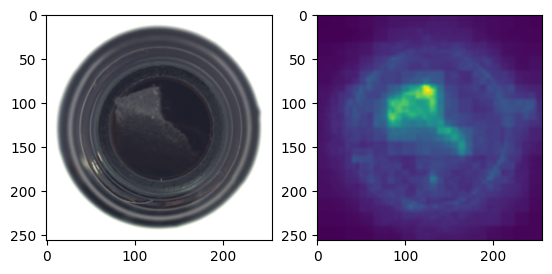

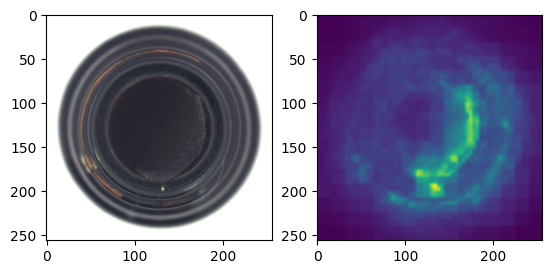

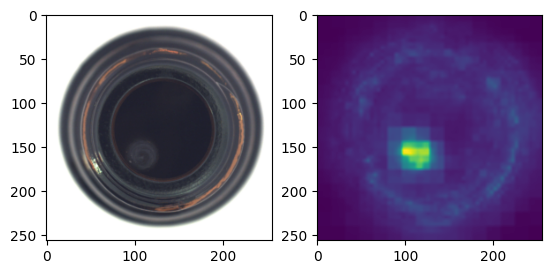

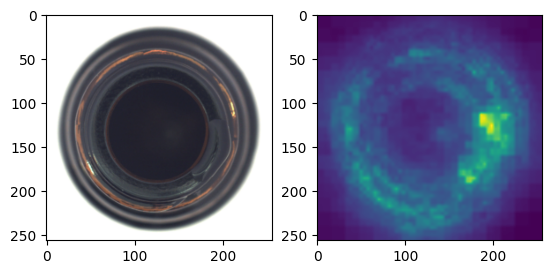

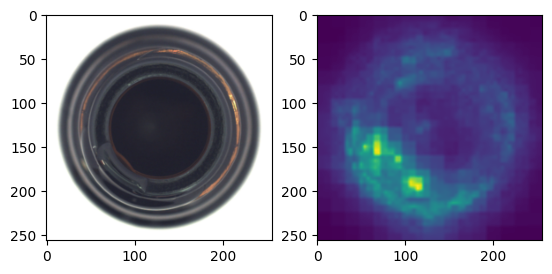

...

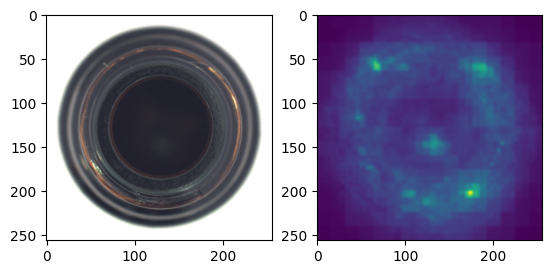

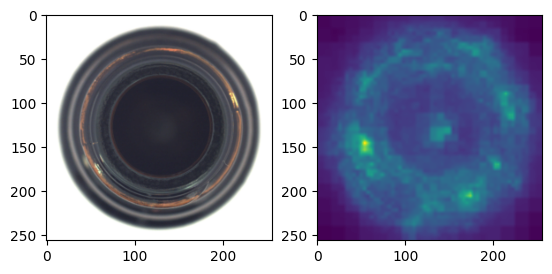

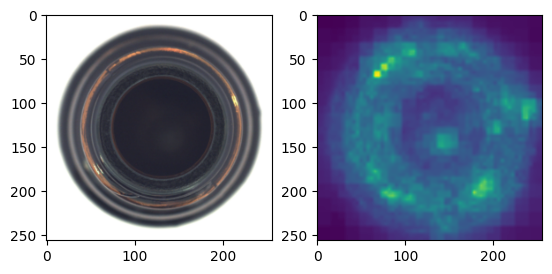

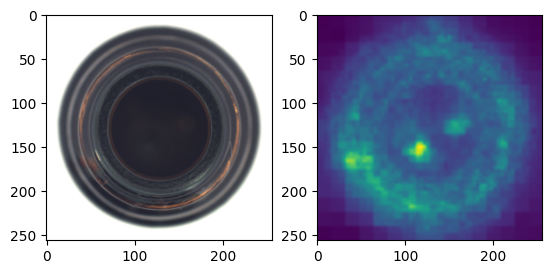

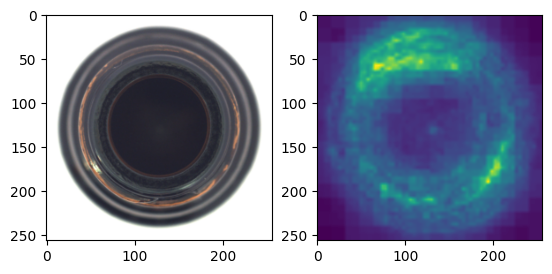

In [223]:
if not os.path.isdir("./tmp/bottle/viz"):
  os.makedirs("./tmp/bottle/viz")
for i in range(len(scores)):
  fig, ax = matplotlib.pyplot.subplots(1, 2)
  denorm_test = (((test_list[i].transpose(1, 2, 0) * numpy.array([0.1, 0.1, 0.1])) + numpy.array([0.5, 0.5, 0.5])) * 255).astype(numpy.uint8)
  ax[0].imshow(denorm_test)
  ax[1].imshow(255 * scores[i])
  fig.savefig(f"./tmp/bottle/viz/{i:02}")
